# Librerias

In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
from itertools import combinations



## Paso 2: Preprocesamiento de Imágenes


In [ ]:
ruta_imagenes = "../imagenes/"

if not os.path.exists("../imagenes_procesadas"):
    os.makedirs("../imagenes_procesadas")

for i in range(1, 23):  
    ruta_imagen = os.path.join(ruta_imagenes, f"{i}.jpg")
    

    if not os.path.exists(ruta_imagen):
        print(f"Advertencia: No se encontró {ruta_imagen}")
        continue
    
    imagen = cv2.imread(ruta_imagen)

    # Convertir a escala de grises
    imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

    # Aplicar ecualización de histograma para mejorar el contraste
    imagen_mejorada = cv2.equalizeHist(imagen_gris)

    # Aplicar reducción de ruido con filtro Gaussiano
    imagen_denoise = cv2.GaussianBlur(imagen_mejorada, (5, 5), 0)

    # Guardar la imagen procesada
    ruta_salida = os.path.join("imagenes_procesadas", f"{i}.jpg")
    cv2.imwrite(ruta_salida, imagen_denoise)



print("Preprocesamiento completado.")

Preprocesamiento completado.


## PASO 3 : Detección de Características y Emparejamiento

## Extracción entre todas las fotos

Se emparejarán 231 pares de imágenes...

Pares 1.jpg vs 10.jpg:
 - Matches totales tras ratio test: 102
 - Inliers tras F RANSAC: 25


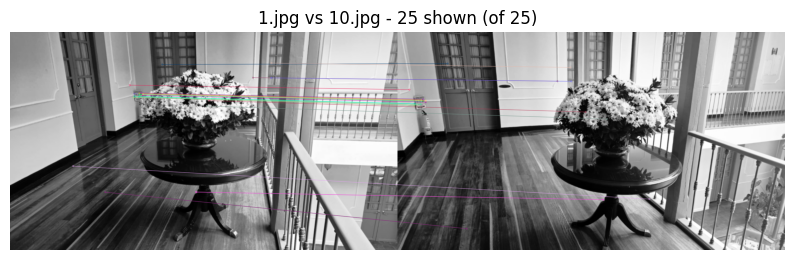


Pares 1.jpg vs 11.jpg:
 - Matches totales tras ratio test: 114
 - Inliers tras F RANSAC: 30


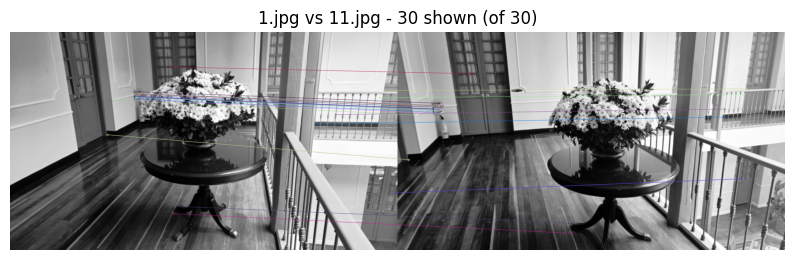


Pares 1.jpg vs 12.jpg:
 - Matches totales tras ratio test: 63
 - Inliers tras F RANSAC: 12


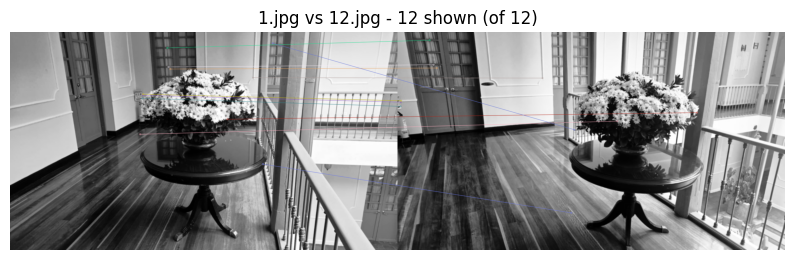


Pares 1.jpg vs 13.jpg:
 - Matches totales tras ratio test: 68
 - Inliers tras F RANSAC: 12


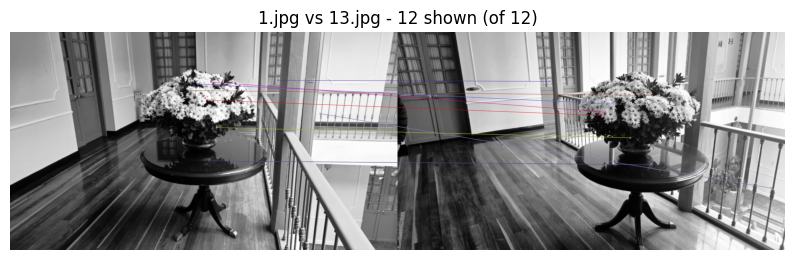


Pares 1.jpg vs 14.jpg:
 - Matches totales tras ratio test: 71
 - Inliers tras F RANSAC: 11


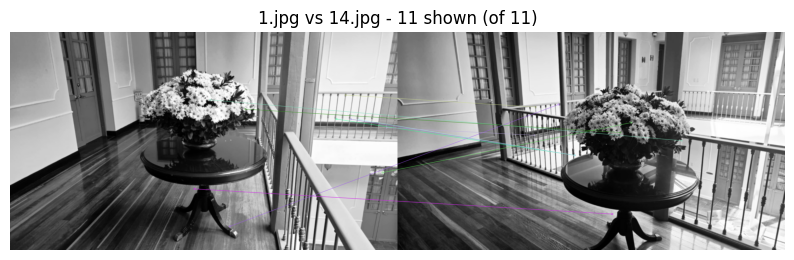


Pares 1.jpg vs 15.jpg:
 - Matches totales tras ratio test: 43
 - Inliers tras F RANSAC: 10

Pares 1.jpg vs 16.jpg:
 - Matches totales tras ratio test: 63
 - Inliers tras F RANSAC: 11

Pares 1.jpg vs 17.jpg:
 - Matches totales tras ratio test: 76
 - Inliers tras F RANSAC: 11

Pares 1.jpg vs 18.jpg:
 - Matches totales tras ratio test: 68
 - Inliers tras F RANSAC: 13

Pares 1.jpg vs 19.jpg:
 - Matches totales tras ratio test: 61
 - Inliers tras F RANSAC: 12

Pares 1.jpg vs 2.jpg:
 - Matches totales tras ratio test: 2439
 - Inliers tras F RANSAC: 2027

Pares 1.jpg vs 20.jpg:
 - Matches totales tras ratio test: 54
 - Inliers tras F RANSAC: 11

Pares 1.jpg vs 21.jpg:
 - Matches totales tras ratio test: 60
 - Inliers tras F RANSAC: 12

Pares 1.jpg vs 22.jpg:
 - Matches totales tras ratio test: 58
 - Inliers tras F RANSAC: 12

Pares 1.jpg vs 3.jpg:
 - Matches totales tras ratio test: 2006
 - Inliers tras F RANSAC: 1684

Pares 1.jpg vs 4.jpg:
 - Matches totales tras ratio test: 1102
 - Inliers

In [4]:
import os
import itertools
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detectar_y_describir(imagen, detector=None):
    if detector is None:
        detector = cv2.SIFT_create()
    kps, des = detector.detectAndCompute(imagen, None)
    return kps, des

def emparejar_descriptores_ratio_test(des1, des2, ratio=0.75):
    bf = cv2.BFMatcher(cv2.NORM_L2)  
    knn_matches = bf.knnMatch(des1, des2, k=2)

    good_matches = []
    for m, n in knn_matches:
        if m.distance < ratio * n.distance:
            good_matches.append(m)
    return good_matches

def calcular_matriz_fundamental(kps1, kps2, matches, reproj_thresh=1.0, conf=0.99):

    if len(matches) < 8:
        return None, []

    # Extraer puntos (x,y) de cada match
    pts1 = np.float32([kps1[m.queryIdx].pt for m in matches])
    pts2 = np.float32([kps2[m.trainIdx].pt for m in matches])

    # Calcular F con RANSAC
    F, mask_F = cv2.findFundamentalMat(
        pts1, pts2,
        cv2.FM_RANSAC,
        ransacReprojThreshold=reproj_thresh,
        confidence=conf
    )
    if F is None:
        return None, []

    mask_F = mask_F.ravel().astype(bool)
    inlier_matches = [m for m, keep in zip(matches, mask_F) if keep]

    return F, inlier_matches

def dibujar_emparejamientos(img1, img2, kps1, kps2, matches, title="Emparejamiento"):
    num_to_draw = min(len(matches), 50)  
    img_matches = cv2.drawMatches(
        img1, kps1,
        img2, kps2,
        matches[:num_to_draw],
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    plt.figure(figsize=(10, 6))
    plt.imshow(img_matches, cmap='gray')
    plt.title(title + f" - {num_to_draw} shown (of {len(matches)})")
    plt.axis('off')
    plt.show()

def pipeline_emparejar_todas_imagenes(ruta_imagenes, extension=".jpg", max_visualizaciones=5):
    # 1) Listar imágenes
    all_files = sorted([
        f for f in os.listdir(ruta_imagenes)
        if f.lower().endswith(extension)
    ])
    image_paths = [os.path.join(ruta_imagenes, f) for f in all_files]
    if len(image_paths) < 2:
        print("Se necesitan al menos 2 imágenes para emparejar.")
        return {}, {}, {}, {}

    # 2) Detectar y describir características
    keypoints_dict = {}
    descriptors_dict = {}
    for img_path in image_paths:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"[ADVERTENCIA] No se pudo cargar {img_path}, se omite.")
            continue
        kps, des = detectar_y_describir(img)
        keypoints_dict[img_path] = kps
        descriptors_dict[img_path] = des

    # 3) Emparejar todas las imágenes (combinaciones de 2)
    matches_dict = {}
    F_dict = {}
    combi = list(itertools.combinations(image_paths, 2))
    print(f"Se emparejarán {len(combi)} pares de imágenes...")

    visualizaciones_hechas = 0
    for (imgA, imgB) in combi:
        desA = descriptors_dict.get(imgA, None)
        desB = descriptors_dict.get(imgB, None)
        kpsA = keypoints_dict.get(imgA, [])
        kpsB = keypoints_dict.get(imgB, [])

        if desA is None or desB is None:
            continue

        # 4) Emparejar con Ratio Test
        raw_matches = emparejar_descriptores_ratio_test(desA, desB, ratio=0.75)

        if len(raw_matches) < 8:
            # Muy pocos matches => no calculamos F
            matches_dict[(imgA, imgB)] = []
            F_dict[(imgA, imgB)] = None
            continue

        # 5) Calcular F con RANSAC y filtrar inliers
        F, inlier_matches = calcular_matriz_fundamental(kpsA, kpsB, raw_matches)
        F_dict[(imgA, imgB)] = F
        matches_dict[(imgA, imgB)] = inlier_matches

        print(f"\nPares {os.path.basename(imgA)} vs {os.path.basename(imgB)}:")
        print(f" - Matches totales tras ratio test: {len(raw_matches)}")
        if F is not None:
            print(f" - Inliers tras F RANSAC: {len(inlier_matches)}")
        else:
            print(" - No se pudo estimar F (None)")


        if visualizaciones_hechas < max_visualizaciones and len(inlier_matches) > 0:
            imgA_rgb = cv2.imread(imgA, cv2.IMREAD_COLOR)
            imgB_rgb = cv2.imread(imgB, cv2.IMREAD_COLOR)
            dibujar_emparejamientos(imgA_rgb, imgB_rgb, kpsA, kpsB, inlier_matches,
                                    title=f"{os.path.basename(imgA)} vs {os.path.basename(imgB)}")
            visualizaciones_hechas += 1

    return keypoints_dict, descriptors_dict, matches_dict, F_dict


if __name__ == "__main__":
    ruta_imagenes = "../imagenes/imagenes_procesadas/"
    # Llama a la función principal
    kps_dict, des_dict, matches_dict, F_dict = pipeline_emparejar_todas_imagenes(
        ruta_imagenes=ruta_imagenes,
        extension=".jpg",  # o ".png", ajusta según tus archivos
        max_visualizaciones=5  # cuántos pares quieres visualizar
    )


    print("\n===== RESULTADOS =====")
    print(f"Total de imágenes procesadas: {len(kps_dict)}")
    print(f"Total de pares emparejados: {len(matches_dict)}")


    for pair, inliers in matches_dict.items():
        imgA, imgB = pair
        print(f"Pares {os.path.basename(imgA)} vs {os.path.basename(imgB)} -> {len(inliers)} inliers")
  


## Extracion 1x1

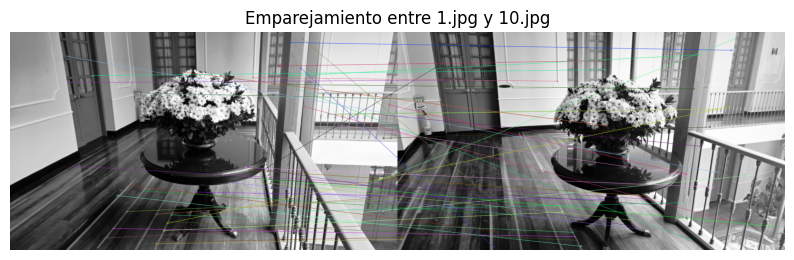

Emparejadas 1171 características entre 1.jpg y 10.jpg


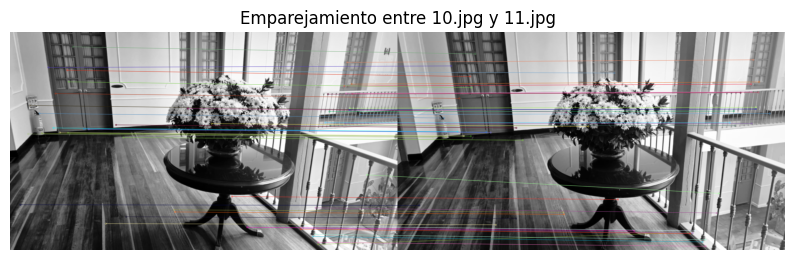

Emparejadas 1817 características entre 10.jpg y 11.jpg


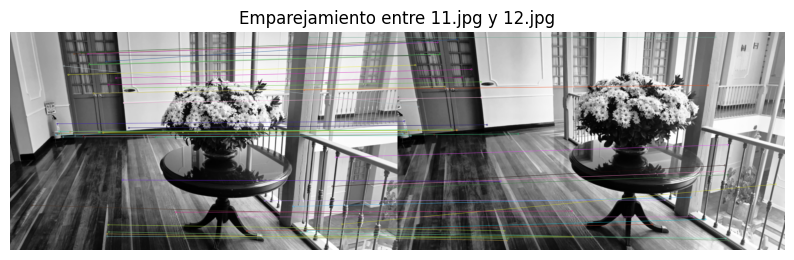

Emparejadas 1435 características entre 11.jpg y 12.jpg


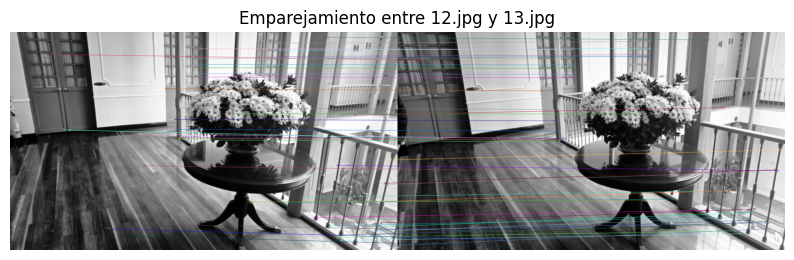

Emparejadas 1954 características entre 12.jpg y 13.jpg


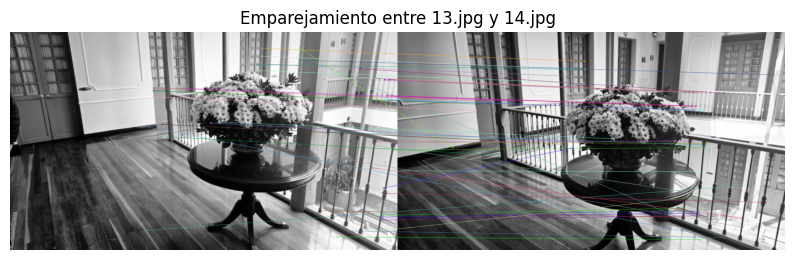

Emparejadas 1397 características entre 13.jpg y 14.jpg


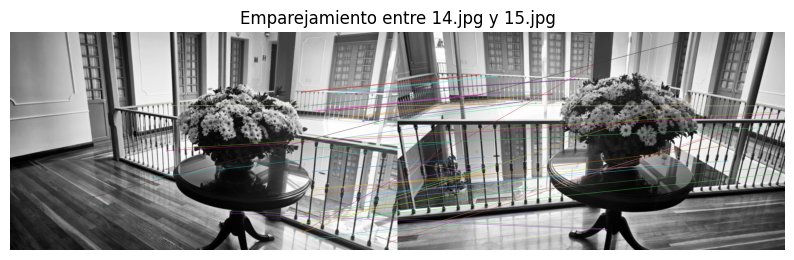

Emparejadas 1557 características entre 14.jpg y 15.jpg


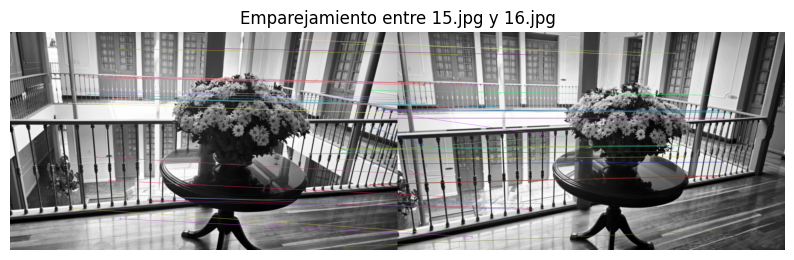

Emparejadas 1909 características entre 15.jpg y 16.jpg


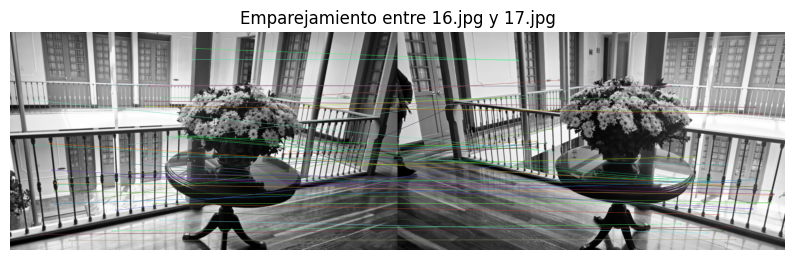

Emparejadas 1587 características entre 16.jpg y 17.jpg


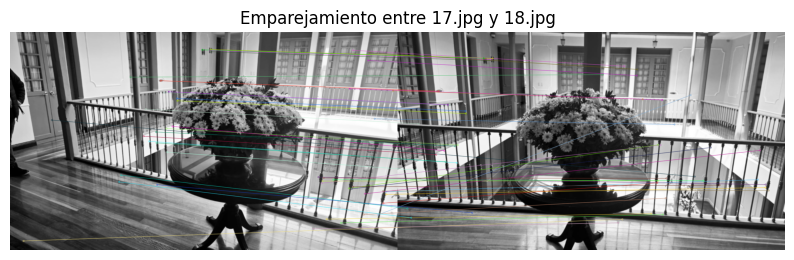

Emparejadas 1719 características entre 17.jpg y 18.jpg


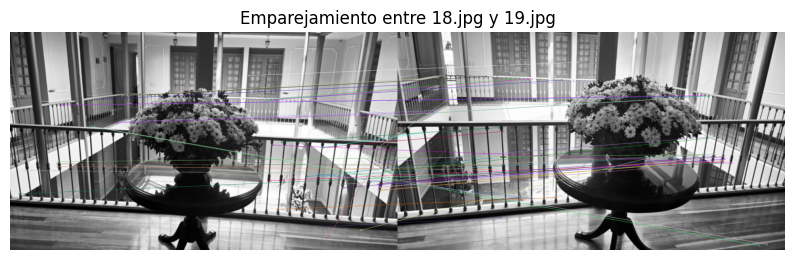

Emparejadas 1724 características entre 18.jpg y 19.jpg


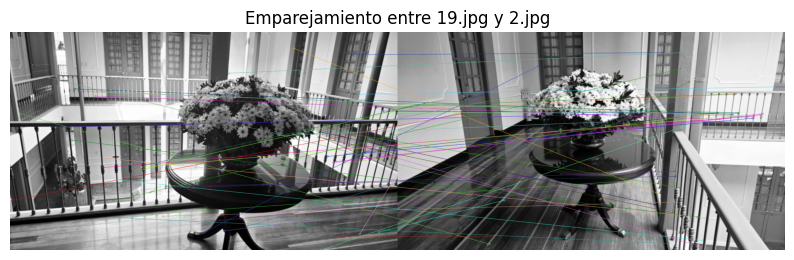

Emparejadas 1311 características entre 19.jpg y 2.jpg


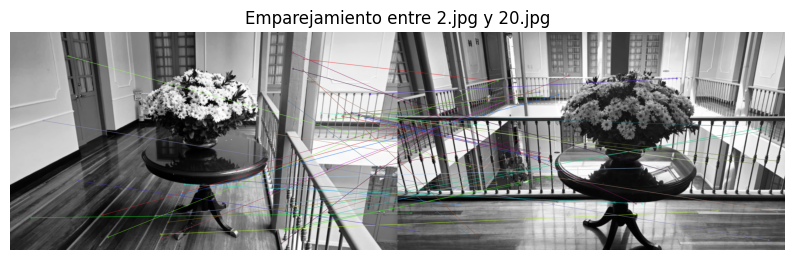

Emparejadas 1291 características entre 2.jpg y 20.jpg


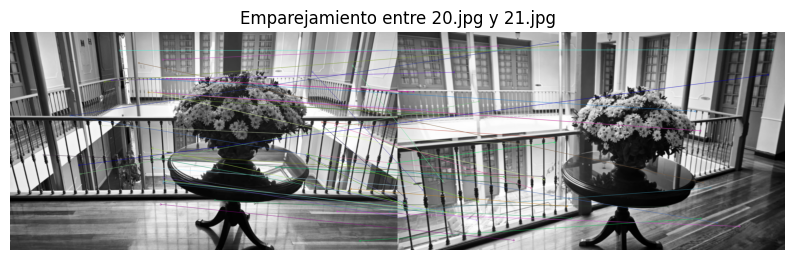

Emparejadas 1518 características entre 20.jpg y 21.jpg


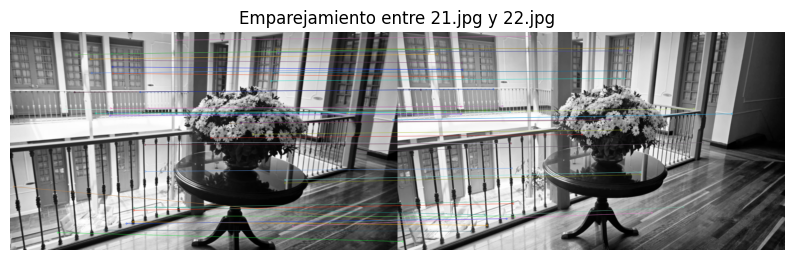

Emparejadas 2146 características entre 21.jpg y 22.jpg


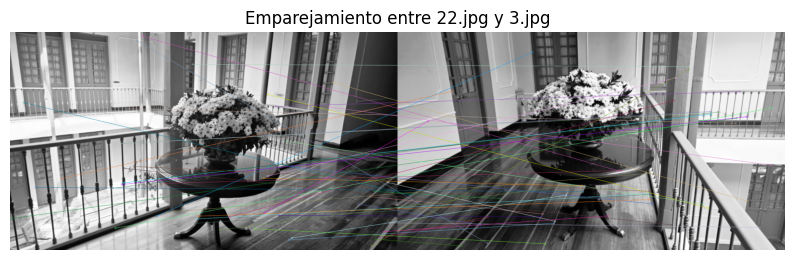

Emparejadas 1178 características entre 22.jpg y 3.jpg


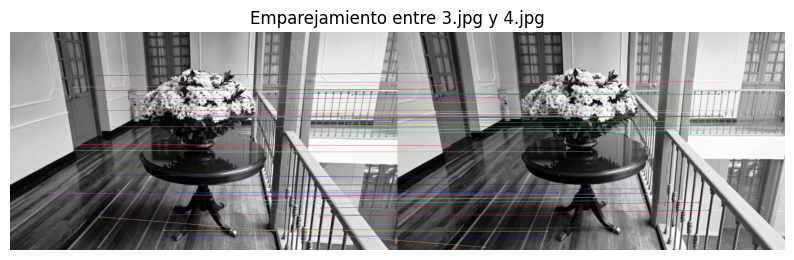

Emparejadas 2118 características entre 3.jpg y 4.jpg


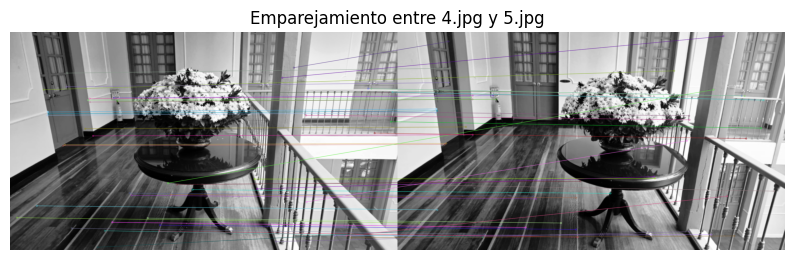

Emparejadas 1397 características entre 4.jpg y 5.jpg


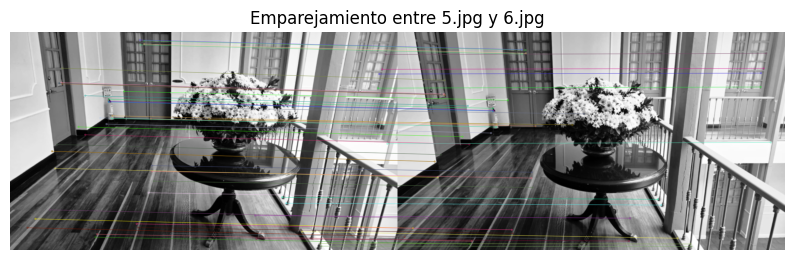

Emparejadas 1908 características entre 5.jpg y 6.jpg


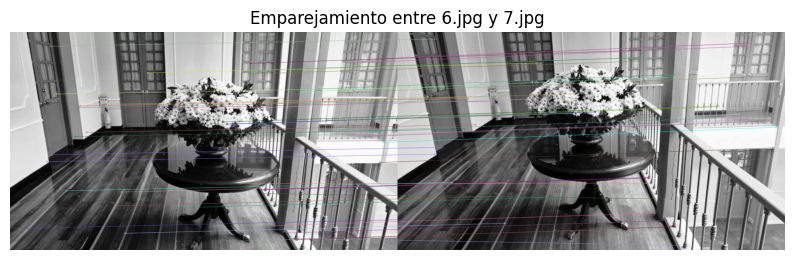

Emparejadas 1943 características entre 6.jpg y 7.jpg


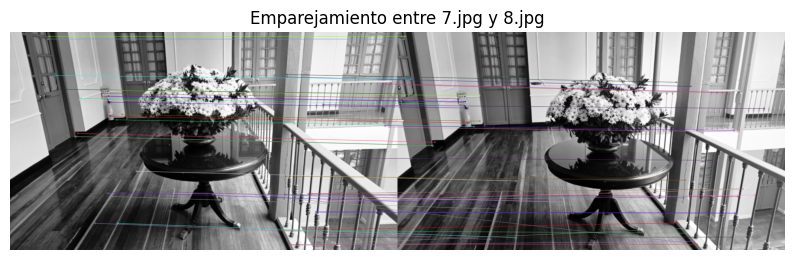

Emparejadas 1484 características entre 7.jpg y 8.jpg


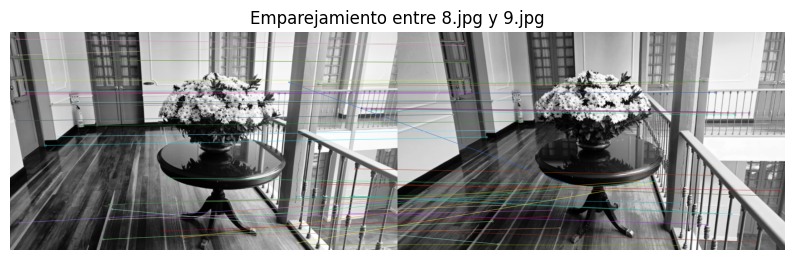

Emparejadas 1344 características entre 8.jpg y 9.jpg


In [5]:

# Directorio de imágenes
ruta_imagenes = "../imagenes/imagenes_procesadas/"
imagenes = sorted([os.path.join(ruta_imagenes, f) 
                   for f in os.listdir(ruta_imagenes) 
                   if f.endswith(".jpg")])

# Crear el objeto SIFT
sift = cv2.SIFT_create()

# Diccionarios para almacenar keypoints y descriptores
keypoints_dict = {}
descriptors_dict = {}

# Detectar y almacenar keypoints y descriptores para cada imagen
for img_path in imagenes:
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        continue  # Omitir imágenes que no se pueden cargar

    keypoints, descriptors = sift.detectAndCompute(img, None)
    keypoints_dict[img_path] = keypoints
    descriptors_dict[img_path] = descriptors

# Inicializar el emparejador BFMatcher
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Emparejar **solo imágenes consecutivas**: 1 con 2, luego (resultado) con 3, etc.
for i in range(len(imagenes) - 1):
    img1_path = imagenes[i]
    img2_path = imagenes[i + 1]

    des1 = descriptors_dict.get(img1_path)
    des2 = descriptors_dict.get(img2_path)

    if des1 is None or des2 is None:
        continue  # Omitir si no hay descriptores

    # Realizar el emparejamiento
    matches = bf.match(des1, des2)
    # Ordenar los matches por distancia (de menor a mayor)
    matches = sorted(matches, key=lambda x: x.distance)


    if i % 1 == 0:
        img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
        img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

        # Dibujar los primeros 50 matches (por ejemplo)
        match_img = cv2.drawMatches(img1, keypoints_dict[img1_path], 
                                    img2, keypoints_dict[img2_path], 
                                    matches[:50], None, 
                                    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

        plt.figure(figsize=(10, 5))
        plt.imshow(match_img, cmap='gray')
        plt.title(f"Emparejamiento entre {os.path.basename(img1_path)} y {os.path.basename(img2_path)}")
        plt.axis("off")
        plt.show()

    # Mostrar en consola cuántas características se emparejaron
    print(f"Emparejadas {len(matches)} características entre {os.path.basename(img1_path)} y {os.path.basename(img2_path)}")




## Calibracion camara

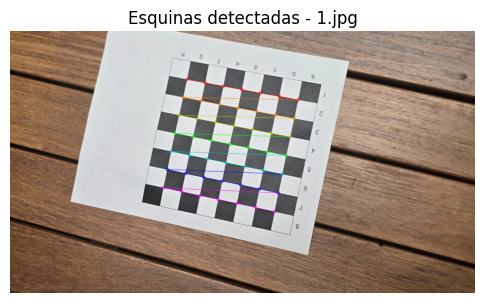

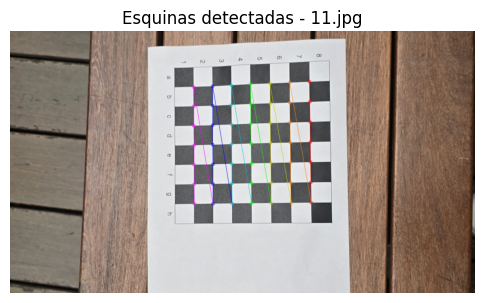

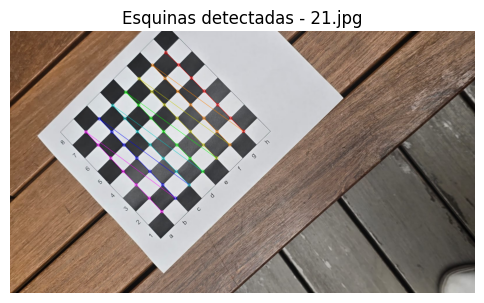

No se detectaron esquinas en ../imagenes/calibracion/31.jpg


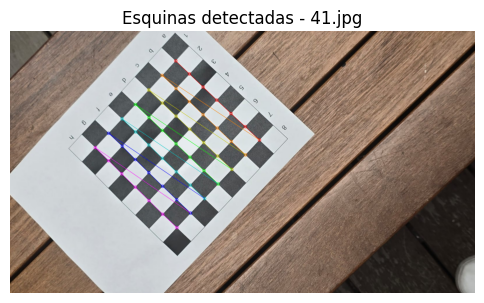

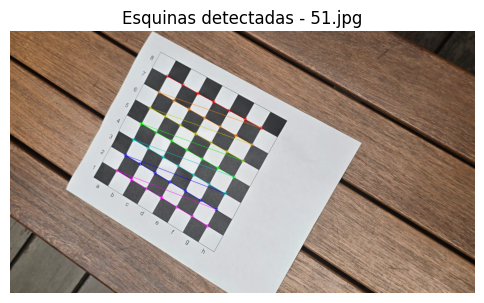

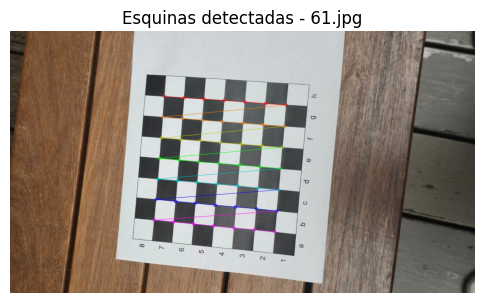

Resultados de la calibración:
Matriz Intrínseca K:
 [[4.53820432e+03 0.00000000e+00 7.32455639e+02]
 [0.00000000e+00 4.51709244e+03 5.25467096e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Distorsión:
 [[ 5.23009215e-01 -5.40373191e+01  2.44403593e-02  5.85154718e-02
   1.25221682e+03]]
fx = 4538.2043175757235, fy = 4517.09243832689, cx = 732.455638781203, cy = 525.4670958979789


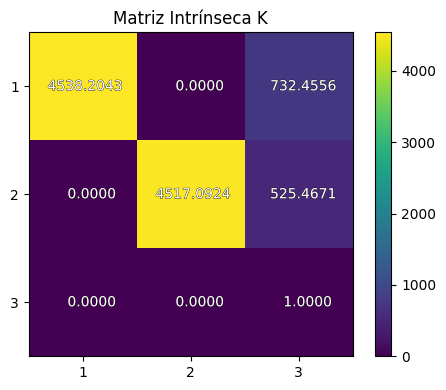

In [7]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import patheffects as PathEffects

def calibrar_camara(ruta_imagenes="../imagenes/calibracion/", pattern_size=(7, 7), square_size=1):

    # Listas para almacenar puntos 3D en el mundo real y puntos 2D en la imagen
    obj_points = []
    img_points = []

    # Puntos del objeto en coordenadas del mundo real
    objp = np.zeros((pattern_size[0] * pattern_size[1], 3), np.float32)
    objp[:, :2] = np.mgrid[0:pattern_size[0], 0:pattern_size[1]].T.reshape(-1, 2) * square_size

    # Crear una lista de rutas de imágenes (por ejemplo, de 1.jpg a 62.jpg)
    image_paths = [os.path.join(ruta_imagenes, f"{i}.jpg") for i in range(1, 63)]

    # Iterar sobre las imágenes
    for idx, image_path in enumerate(image_paths):
        if not os.path.exists(image_path):
            print(f"No se encontró {image_path}, saltando...")
            continue

        img = cv2.imread(image_path)
        if img is None:
            print(f"No se pudo cargar {image_path}")
            continue

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, pattern_size, None)

        if ret:
            obj_points.append(objp)
            img_points.append(corners)

            # Dibuja y muestra cada 10 imágenes para no saturar con demasiadas ventanas
            if idx % 10 == 0:
                cv2.drawChessboardCorners(img, pattern_size, corners, ret)
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                plt.figure(figsize=(6, 6))
                plt.imshow(img_rgb)
                plt.title(f'Esquinas detectadas - {os.path.basename(image_path)}')
                plt.axis('off')
                plt.show()
        else:
            print(f"No se detectaron esquinas en {image_path}")

    # Verificar si se obtuvieron puntos suficientes para calibrar
    if len(obj_points) > 0:
        ret, K, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, gray.shape[::-1], None, None)

        # Extracción de parámetros intrínsecos
        fx = K[0, 0]
        fy = K[1, 1]
        cx = K[0, 2]
        cy = K[1, 2]

        print("Resultados de la calibración:")
        print("Matriz Intrínseca K:\n", K)
        print("Distorsión:\n", dist)
        print(f"fx = {fx}, fy = {fy}, cx = {cx}, cy = {cy}")
        
        return fx, fy, cx, cy, K
    else:
        print("Error: No se detectaron suficientes puntos en las imágenes.")
        return None, None, None, None, None

def mostrar_matriz_como_imagen(matriz, titulo="Matriz"):
    if matriz is None:
        print("No hay matriz para mostrar.")
        return

    fig, ax = plt.subplots(figsize=(5, 4))
    cax = ax.imshow(matriz, cmap='viridis')
    fig.colorbar(cax)

    for i in range(matriz.shape[0]):
        for j in range(matriz.shape[1]):
            valor = matriz[i, j]
            txt = ax.text(j, i, f"{valor:10.4f}", ha='center', va='center', color='white')
            txt.set_path_effects([PathEffects.withStroke(linewidth=0.5, foreground='black')])

    ax.set_title(titulo)
    ax.set_xticks(np.arange(matriz.shape[1]))
    ax.set_yticks(np.arange(matriz.shape[0]))
    ax.set_xticklabels(range(1, matriz.shape[1] + 1))
    ax.set_yticklabels(range(1, matriz.shape[0] + 1))

    plt.tight_layout()
    plt.show()


fx, fy, cx, cy, K = calibrar_camara("../imagenes/calibracion/", (7, 7), 1)
if K is not None:
    mostrar_matriz_como_imagen(K, "Matriz Intrínseca K")


## Paso 4: Estimación de la Matriz Fundamental y la Matriz Esencial

Matriz Fundamental (F):
[[ 1.66608644e-07 -1.58163321e-06 -5.98243446e-04]
 [ 6.61103054e-06 -1.96796319e-06 -3.08840558e-02]
 [-9.08438664e-04  2.78669517e-02  1.00000000e+00]]


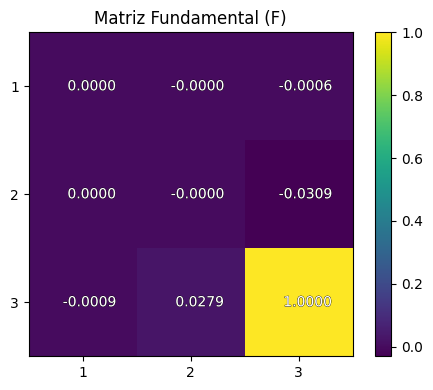

Matriz Esencial (E):
[[   3.43135475  -32.42267172   -5.93282272]
 [ 135.52274399  -40.15456517 -122.30420356]
 [  12.19630519  115.97352793   -0.20724696]]


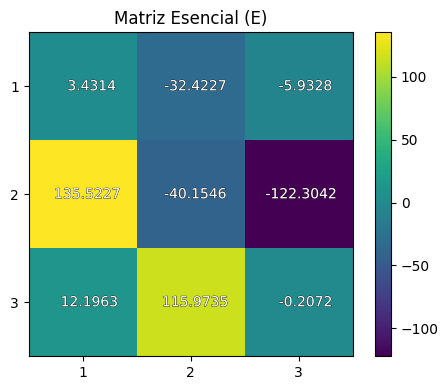

Matriz de Rotación (R):
[[ 0.82939726 -0.05971648  0.55545849]
 [ 0.12956465  0.98772273 -0.08727429]
 [-0.54342726  0.14435284  0.82695167]]


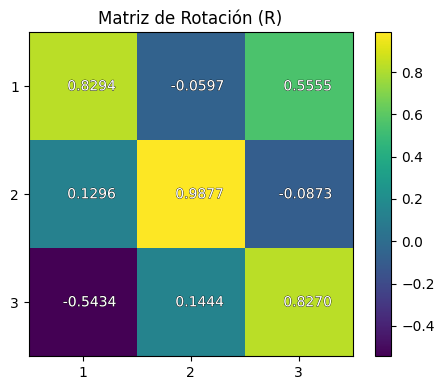

Vector de Traslación (t):
[[-0.96612014]
 [ 0.04729521]
 [-0.25372236]]


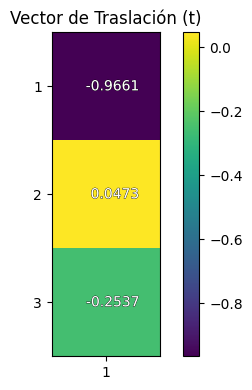

In [ ]:

img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

kp1 = keypoints_dict[img1_path]
kp2 = keypoints_dict[img2_path]

pts1 = []
pts2 = []
for m in matches:
    pts1.append(kp1[m.queryIdx].pt)
    pts2.append(kp2[m.trainIdx].pt)

pts1 = np.array(pts1, dtype=np.float32)
pts2 = np.array(pts2, dtype=np.float32)

F, mask_F = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC, 
                                   ransacReprojThreshold=1.0, 
                                   confidence=0.99)

inliers1 = pts1[mask_F.ravel() == 1]
inliers2 = pts2[mask_F.ravel() == 1]


if F is None:
    print("No se pudo estimar la Matriz Fundamental")
else:
    print("Matriz Fundamental (F):")
    print(F)
    mostrar_matriz_como_imagen(F,"Matriz Fundamental (F)")


E = (K.T).dot(F).dot(K)

print("Matriz Esencial (E):")
print(E)
mostrar_matriz_como_imagen(E,"Matriz Esencial (E)")

retval, R, t, mask_pose = cv2.recoverPose(E, inliers1, inliers2, K)

print("Matriz de Rotación (R):")
print(R)
mostrar_matriz_como_imagen(R,"Matriz de Rotación (R)")
print("Vector de Traslación (t):")
print(t)
mostrar_matriz_como_imagen(t,"Vector de Traslación (t)")


## Con extracion de caracteriscas 1x1

In [8]:




def detectar_y_describir(img, detector=None):
    """Detecta keypoints y descriptores SIFT (o cualquier otro)."""
    if detector is None:
        detector = cv2.SIFT_create()
    kp, des = detector.detectAndCompute(img, None)
    return kp, des

def emparejar_descriptores(des1, des2, crossCheck=True):
    """Empareja descriptores con BFMatcher. Retorna los matches ordenados."""
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=crossCheck)
    matches = bf.match(des1, des2)
    return sorted(matches, key=lambda x: x.distance)

def estimar_pose_con_dos_imagenes(img1, img2, K):
    """
    Dadas dos imágenes y la K calibrada:
      1) detecta y empareja (SIFT)
      2) F con RANSAC
      3) E = K^T F K
      4) (R, t) con recoverPose
    Retorna: R, t, matches_inliers, pts1_inliers, pts2_inliers
    """
    kp1, des1 = detectar_y_describir(img1)
    kp2, des2 = detectar_y_describir(img2)
    matches = emparejar_descriptores(des1, des2, crossCheck=True)

    # Extraemos puntos 2D
    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches])

    # Matriz Fundamental con RANSAC
    F, mask_F = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC,
                                       ransacReprojThreshold=1.0,
                                       confidence=0.99)
    if F is None:
        print("No se encontró F en este par.")
        return None, None, [], [], []

    # Filtramos inliers
    inlier_mask = mask_F.ravel().astype(bool)
    pts1_in = pts1[inlier_mask]
    pts2_in = pts2[inlier_mask]
    matches_in = [m for m, keep in zip(matches, inlier_mask) if keep]

    # Matriz Esencial
    E = K.T @ F @ K

    # Recuperar pose
    _, R, t, mask_pose = cv2.recoverPose(E, pts1_in, pts2_in, K)
    
    # Retornar
    return R, t, matches_in, pts1_in, pts2_in


def triangulate_points(R1, t1, R2, t2, K, pts1, pts2):
    """
    Triangula puntos 3D a partir de correspondencias 2D en dos vistas con poses conocidas.
    Se asume que la primera cámara está en [R1|t1], la segunda en [R2|t2].
    """
    # Proyección de la primera cámara: P1 = K [R1 | t1]
    P1 = K @ np.hstack((R1, t1))
    # Proyección de la segunda cámara: P2 = K [R2 | t2]
    P2 = K @ np.hstack((R2, t2))

    # Necesitamos pts1 y pts2 en shape = (2, N)
    pts1_hom = np.vstack((pts1.T, np.ones((1, pts1.shape[0]))))
    pts2_hom = np.vstack((pts2.T, np.ones((1, pts2.shape[0]))))

    # Triangular
    points_4d = cv2.triangulatePoints(P1, P2, pts1_hom[:2], pts2_hom[:2])
    # Convertir de homogéneo a (x, y, z)
    points_3d = points_4d[:3] / points_4d[3]
    points_3d = points_3d.T  # shape (N, 3)

    return points_3d


def incremental_sfm(image_paths, K):

    n = len(image_paths)
    if n < 2:
        print("Se requieren al menos 2 imágenes para SFM.")
        return [], []

    # Lee todas las imágenes
    imgs = []
    for p in image_paths:
        img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise ValueError(f"No se pudo cargar {p}")
        imgs.append(img)

    # Pose de la primera cámara = identidad
    # R0 = I, t0 = [0,0,0]
    poses_R = [np.eye(3, dtype=np.float32)]
    poses_t = [np.zeros((3,1), dtype=np.float32)]

    # 1) Calcular pose entre la primera y segunda imagen
    R, t, matches_in, pts1_in, pts2_in = estimar_pose_con_dos_imagenes(imgs[0], imgs[1], K)
    if R is None:
        print("No se pudo recuperar la pose para la primera pareja.")
        return [], []

    # Guardamos la pose "global" de la segunda cámara:
    #   si la primera es (R0=I, t0=0), la segunda es (R, t) en el mismo frame de referencia.
    poses_R.append(R)
    poses_t.append(t)

    # Triangulamos puntos 3D con la base (cámara 0 y 1)
    #   Cámara 0 => [I|0]
    #   Cámara 1 => [R|t]
    pts3d_base = triangulate_points(
        poses_R[0], poses_t[0],  
        poses_R[1], poses_t[1],
        K, pts1_in, pts2_in
    )

    # Almacenamos una nube 3D inicial
    puntos_3d_global = list(pts3d_base)  # un list de shape (N, 3)

    # 2) Para cada imagen subsecuente (3ra, 4ta, etc.)
    for i in range(2, n):
        print(f"\n=== Procesando imagen {i+1} / {n} ===")
        # Pose relativa entre imagen (i-1) e imagen i
        R_rel, t_rel, matches_inlier, ptsA_in, ptsB_in = estimar_pose_con_dos_imagenes(
            imgs[i-1],  # anterior
            imgs[i],    # actual
            K
        )
        if R_rel is None:
            print(f"No se pudo recuperar la pose entre la imagen {i-1} y {i}. Se omite.")
            poses_R.append(None)
            poses_t.append(None)
            continue

        # La pose global de la nueva cámara i:
        #   si la cámara (i-1) tiene pose global (R_{i-1}, t_{i-1}),
        #   la cámara i es: R_i = R_{i-1} * R_rel
        #                  t_i = t_{i-1} + R_{i-1} * t_rel
        R_prev = poses_R[i-1]
        t_prev = poses_t[i-1]

        R_i = R_prev @ R_rel
        t_i = t_prev + R_prev @ t_rel

        poses_R.append(R_i)
        poses_t.append(t_i)

        # Triangular puntos 3D con la cámara i y alguna cámara anterior.
        # Por simplicidad, aquí triangulamos con la (i-1):
        pts3d_new = triangulate_points(
            R_prev, t_prev,
            R_i, t_i,
            K, ptsA_in, ptsB_in
        )
        # Agregamos esos puntos a la nube global
        puntos_3d_global.extend(pts3d_new)

    # Retornamos la pose estimada de cada imagen y la nube 3D (en bruto)
    return (poses_R, poses_t), np.array(puntos_3d_global)

if __name__ == "__main__":

    fx = fx; fy = fy; cx = cx; cy = cy
    K = K

    ruta_escena = "../imagenes/imagenes_procesadas/"
    image_paths = [os.path.join(ruta_escena, f"{i}.jpg") for i in range(1, 23)]

    (Rs, ts), nube_3d = incremental_sfm(image_paths, K)

    print("\n=== Poses de cámara estimadas ===")
    for i, (R, t) in enumerate(zip(Rs, ts)):
        if R is None:
            print(f"Cámara {i}: Pose no encontrada")
            continue
        print(f"Cámara {i}:\n R =\n{R}\n t =\n{t.ravel()}\n")

    print(f"\nSe obtuvieron {len(nube_3d)} puntos en la nube 3D.")
    




=== Procesando imagen 3 / 22 ===

=== Procesando imagen 4 / 22 ===

=== Procesando imagen 5 / 22 ===

=== Procesando imagen 6 / 22 ===

=== Procesando imagen 7 / 22 ===

=== Procesando imagen 8 / 22 ===

=== Procesando imagen 9 / 22 ===

=== Procesando imagen 10 / 22 ===

=== Procesando imagen 11 / 22 ===

=== Procesando imagen 12 / 22 ===

=== Procesando imagen 13 / 22 ===

=== Procesando imagen 14 / 22 ===

=== Procesando imagen 15 / 22 ===

=== Procesando imagen 16 / 22 ===

=== Procesando imagen 17 / 22 ===

=== Procesando imagen 18 / 22 ===

=== Procesando imagen 19 / 22 ===

=== Procesando imagen 20 / 22 ===

=== Procesando imagen 21 / 22 ===

=== Procesando imagen 22 / 22 ===

=== Poses de cámara estimadas ===
Cámara 0:
 R =
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
 t =
[0. 0. 0.]

Cámara 1:
 R =
[[ 9.99985872e-01 -2.35466628e-03  4.76570154e-03]
 [ 2.35935648e-03  9.99996738e-01 -9.78774518e-04]
 [-4.76338130e-03  9.90004679e-04  9.99988165e-01]]
 t =
[-0.27795094  0.05294961 -0.9

## Con extracion de caracteristicas entre todas

Se emparejarán 231 pares de imágenes...

Pares 1.jpg vs 10.jpg:
 - Matches totales tras ratio test: 102
 - Inliers tras F RANSAC: 25


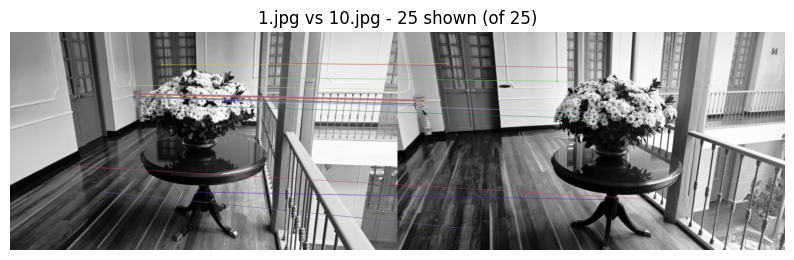


Pares 1.jpg vs 11.jpg:
 - Matches totales tras ratio test: 114
 - Inliers tras F RANSAC: 30


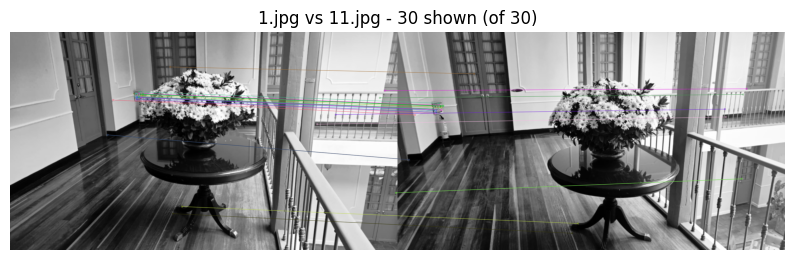


Pares 1.jpg vs 12.jpg:
 - Matches totales tras ratio test: 63
 - Inliers tras F RANSAC: 12


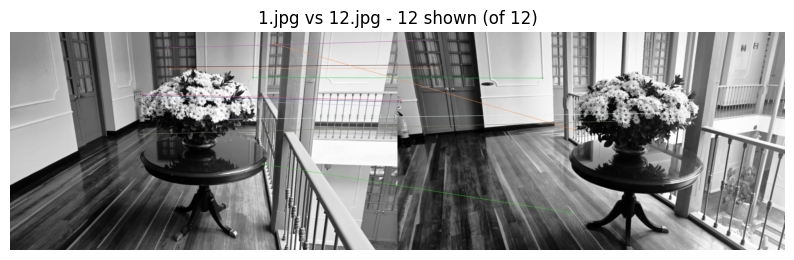


Pares 1.jpg vs 13.jpg:
 - Matches totales tras ratio test: 68
 - Inliers tras F RANSAC: 12


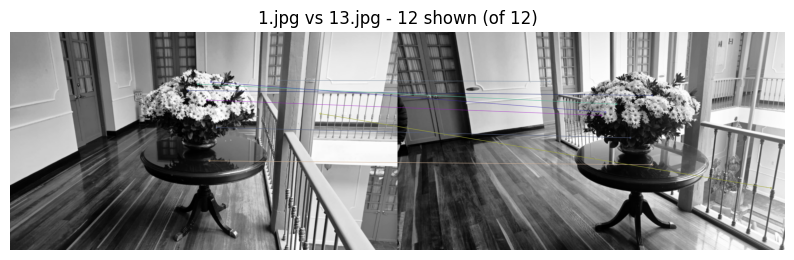


Pares 1.jpg vs 14.jpg:
 - Matches totales tras ratio test: 71
 - Inliers tras F RANSAC: 11


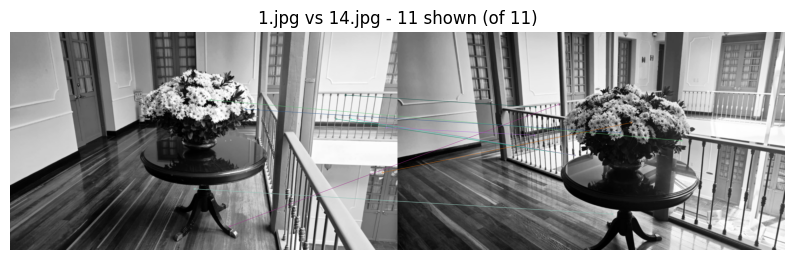


Pares 1.jpg vs 15.jpg:
 - Matches totales tras ratio test: 43
 - Inliers tras F RANSAC: 10

Pares 1.jpg vs 16.jpg:
 - Matches totales tras ratio test: 63
 - Inliers tras F RANSAC: 11

Pares 1.jpg vs 17.jpg:
 - Matches totales tras ratio test: 76
 - Inliers tras F RANSAC: 11

Pares 1.jpg vs 18.jpg:
 - Matches totales tras ratio test: 68
 - Inliers tras F RANSAC: 13

Pares 1.jpg vs 19.jpg:
 - Matches totales tras ratio test: 61
 - Inliers tras F RANSAC: 12

Pares 1.jpg vs 2.jpg:
 - Matches totales tras ratio test: 2439
 - Inliers tras F RANSAC: 2027

Pares 1.jpg vs 20.jpg:
 - Matches totales tras ratio test: 54
 - Inliers tras F RANSAC: 11

Pares 1.jpg vs 21.jpg:
 - Matches totales tras ratio test: 60
 - Inliers tras F RANSAC: 12

Pares 1.jpg vs 22.jpg:
 - Matches totales tras ratio test: 58
 - Inliers tras F RANSAC: 12

Pares 1.jpg vs 3.jpg:
 - Matches totales tras ratio test: 2006
 - Inliers tras F RANSAC: 1684

Pares 1.jpg vs 4.jpg:
 - Matches totales tras ratio test: 1102
 - Inliers

In [ ]:


def detectar_y_describir(imagen, detector=None):
    """
    Detecta keypoints y descriptores en la imagen usando SIFT (por defecto).
    Retorna (keypoints, descriptors).
    """
    if detector is None:
        detector = cv2.SIFT_create()
    kps, des = detector.detectAndCompute(imagen, None)
    return kps, des

def emparejar_descriptores_ratio_test(des1, des2, ratio=0.75):
    """
    Empareja descriptores usando BFMatcher con KNN (k=2).
    Aplica el Ratio Test de Lowe para filtrar matches ambiguos.
    Retorna una lista de matches 'buenos'.
    """
    bf = cv2.BFMatcher(cv2.NORM_L2)  # sin crossCheck
    knn_matches = bf.knnMatch(des1, des2, k=2)
    good_matches = []
    for m, n in knn_matches:
        if m.distance < ratio * n.distance:
            good_matches.append(m)
    return good_matches

def calcular_matriz_fundamental(kps1, kps2, matches, reproj_thresh=1.0, conf=0.99):
    """
    Dada una lista de keypoints (kps1, kps2) y una lista de matches,
    calcula la matriz fundamental F con RANSAC y filtra outliers.

    Retorna:
      - F: matriz fundamental (3x3) o None si no es posible
      - matches_inliers: subset de 'matches' que son inliers respecto a F
    """
    if len(matches) < 8:
        return None, []

    pts1 = np.float32([kps1[m.queryIdx].pt for m in matches])
    pts2 = np.float32([kps2[m.trainIdx].pt for m in matches])

    F, mask_F = cv2.findFundamentalMat(
        pts1, pts2,
        cv2.FM_RANSAC,
        ransacReprojThreshold=reproj_thresh,
        confidence=conf
    )
    if F is None:
        return None, []

    mask_F = mask_F.ravel().astype(bool)
    inlier_matches = [m for (m, keep) in zip(matches, mask_F) if keep]

    return F, inlier_matches

def dibujar_emparejamientos(img1, img2, kps1, kps2, matches, title="Emparejamiento"):
    """
    Dibuja los matches entre dos imágenes, mostrando sólo un subconjunto (ej: primeros 50).
    """
    num_to_draw = min(len(matches), 50)  # ajusta si quieres ver más/menos
    img_matches = cv2.drawMatches(
        img1, kps1,
        img2, kps2,
        matches[:num_to_draw],
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    plt.figure(figsize=(10, 6))
    plt.imshow(img_matches[..., ::-1])  # BGR -> RGB
    plt.title(f"{title} - {num_to_draw} shown (of {len(matches)})")
    plt.axis("off")
    plt.show()

def pipeline_emparejar_todas_imagenes(ruta_imagenes, extension=".jpg", max_visualizaciones=5):

    # 1) Listar imágenes
    all_files = sorted([
        f for f in os.listdir(ruta_imagenes)
        if f.lower().endswith(extension)
    ])
    image_paths = [os.path.join(ruta_imagenes, f) for f in all_files]
    if len(image_paths) < 2:
        print("Se necesitan al menos 2 imágenes para emparejar.")
        return {}, {}, {}, {}

    # 2) Detectar y describir características en cada imagen
    keypoints_dict = {}
    descriptors_dict = {}
    for img_path in image_paths:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"[ADVERTENCIA] No se pudo cargar {img_path}, se omite.")
            continue
        kps, des = detectar_y_describir(img)
        keypoints_dict[img_path] = kps
        descriptors_dict[img_path] = des

    matches_dict = {}
    F_dict = {}
    combi = list(itertools.combinations(image_paths, 2))
    print(f"Se emparejarán {len(combi)} pares de imágenes...")

    visualizaciones_hechas = 0
    for (imgA, imgB) in combi:
        desA = descriptors_dict.get(imgA, None)
        desB = descriptors_dict.get(imgB, None)
        kpsA = keypoints_dict.get(imgA, [])
        kpsB = keypoints_dict.get(imgB, [])

        if desA is None or desB is None:
            continue

        # Ratio Test
        raw_matches = emparejar_descriptores_ratio_test(desA, desB, ratio=0.75)

        if len(raw_matches) < 8:
            matches_dict[(imgA, imgB)] = []
            F_dict[(imgA, imgB)] = None
            continue

        # Calcular F y filtrar inliers
        F, inlier_matches = calcular_matriz_fundamental(kpsA, kpsB, raw_matches)
        F_dict[(imgA, imgB)] = F
        matches_dict[(imgA, imgB)] = inlier_matches

        print(f"\nPares {os.path.basename(imgA)} vs {os.path.basename(imgB)}:")
        print(f" - Matches totales tras ratio test: {len(raw_matches)}")
        if F is not None:
            print(f" - Inliers tras F RANSAC: {len(inlier_matches)}")
        else:
            print(" - No se pudo estimar F (None)")

        if visualizaciones_hechas < max_visualizaciones and len(inlier_matches) > 0:
            imgA_bgr = cv2.imread(imgA)
            imgB_bgr = cv2.imread(imgB)
            dibujar_emparejamientos(imgA_bgr, imgB_bgr, kpsA, kpsB, inlier_matches,
                                    title=f"{os.path.basename(imgA)} vs {os.path.basename(imgB)}")
            visualizaciones_hechas += 1

    return keypoints_dict, descriptors_dict, matches_dict, F_dict

def recover_pose_from_F(keypointsA, keypointsB, inlier_matches, K, F):
    """
    A partir de la F estimada y los matches inliers (keypoints ya precomputados),
    calcula la matriz esencial E = K^T F K, y recupera (R, t) con recoverPose.
    Retorna (R, t)
    """

    ptsA = np.float32([keypointsA[m.queryIdx].pt for m in inlier_matches])
    ptsB = np.float32([keypointsB[m.trainIdx].pt for m in inlier_matches])

    E = K.T @ F @ K
    retval, R, t, mask_pose = cv2.recoverPose(E, ptsA, ptsB, K)
    if retval < 10:  
        print("Warning: recoverPose encontró muy pocos inliers.")
    pose_inliers = mask_pose.ravel().astype(bool)
    ptsA_in = ptsA[pose_inliers]
    ptsB_in = ptsB[pose_inliers]

    return R, t, ptsA_in, ptsB_in

def triangulate_points(R1, t1, R2, t2, K, pts1, pts2):

    P1 = K @ np.hstack((R1, t1))  
    P2 = K @ np.hstack((R2, t2))   

    pts1_h = np.vstack((pts1.T, np.ones((1, pts1.shape[0]))))  
    pts2_h = np.vstack((pts2.T, np.ones((1, pts2.shape[0]))))  

    points_4d = cv2.triangulatePoints(P1, P2, pts1_h[:2], pts2_h[:2])
    points_3d = points_4d[:3] / points_4d[3]
    return points_3d.T 

def incremental_sfm_precomputado(image_paths, K,
                                keypoints_dict,
                                matches_dict,
                                F_dict):

    n = len(image_paths)
    if n < 2:
        print("Se requieren al menos 2 imágenes.")
        return ([], []), np.array([])

    poses_R = [np.eye(3, dtype=np.float64)]
    poses_t = [np.zeros((3,1), dtype=np.float64)]
    nube_3d_global = []

    imgA = image_paths[0]
    imgB = image_paths[1]

    inlier_matches = matches_dict.get((imgA, imgB), None)
    if inlier_matches is None or len(inlier_matches) == 0:

        inlier_matches = matches_dict.get((imgB, imgA), [])
        F = F_dict.get((imgB, imgA), None)
    else:
        F = F_dict.get((imgA, imgB), None)

    if F is None or len(inlier_matches) < 8:
        print("No hay información suficiente para la primera pareja.")
        return (poses_R, poses_t), np.array([])


    kpsA = keypoints_dict[imgA]
    kpsB = keypoints_dict[imgB]
    R12, t12, ptsA_in, ptsB_in = recover_pose_from_F(kpsA, kpsB, inlier_matches, K, F)

    poses_R.append(R12)
    poses_t.append(t12)

    pts3d_01 = triangulate_points(
        poses_R[0], poses_t[0],
        poses_R[1], poses_t[1],
        K, ptsA_in, ptsB_in
    )
    nube_3d_global.extend(pts3d_01)


    for i in range(2, n):
        print(f"\n=== Procesando imagen {i+1} / {n} ===")
        imgPrev = image_paths[i-1]
        imgCurr = image_paths[i]

 
        inlier_matches = matches_dict.get((imgPrev, imgCurr), None)
        F_pc = F_dict.get((imgPrev, imgCurr), None)
        if inlier_matches is None:  
            inlier_matches = matches_dict.get((imgCurr, imgPrev), [])
            F_pc = F_dict.get((imgCurr, imgPrev), None)

        if F_pc is None or len(inlier_matches) < 8:
            print(f"No se pudo usar la pareja {imgPrev} - {imgCurr}")
            poses_R.append(None)
            poses_t.append(None)
            continue

        # Recuperar (R_rel, t_rel)
        kpsPrev = keypoints_dict[imgPrev]
        kpsCurr = keypoints_dict[imgCurr]
        R_rel, t_rel, ptsA_in, ptsB_in = recover_pose_from_F(kpsPrev, kpsCurr,
                                                             inlier_matches,
                                                             K, F_pc)

        if R_rel is None or t_rel is None:
            print("No se pudo recuperar pose en este par.")
            poses_R.append(None)
            poses_t.append(None)
            continue

        R_prev = poses_R[i-1]
        t_prev = poses_t[i-1]
        if R_prev is None or t_prev is None:
            print("La cámara previa no tiene pose válida; se omite.")
            poses_R.append(None)
            poses_t.append(None)
            continue

        R_i = R_prev @ R_rel
        t_i = t_prev + R_prev @ t_rel

        poses_R.append(R_i)
        poses_t.append(t_i)

        pts3d_new = triangulate_points(
            R_prev, t_prev,
            R_i, t_i,
            K, ptsA_in, ptsB_in
        )
        nube_3d_global.extend(pts3d_new)

    nube_3d_global = np.array(nube_3d_global)
    return (poses_R, poses_t), nube_3d_global

if __name__ == "__main__":

    fx = fx; fy = fy
    cx = cx;  cy = cy
    K = K

    ruta_imagenes = "../imagenes/imagenes_procesadas/"
    kps_dict, des_dict, matches_dict, F_dict = pipeline_emparejar_todas_imagenes(
        ruta_imagenes=ruta_imagenes,
        extension=".jpg",
        max_visualizaciones=5
    )

    all_files = sorted([
        f for f in os.listdir(ruta_imagenes) if f.lower().endswith(".jpg")
    ])
    image_paths_ordered = [os.path.join(ruta_imagenes, f) for f in all_files]

    (Rs, ts), nube_3d = incremental_sfm_precomputado(
        image_paths=image_paths_ordered,
        K=K,
        keypoints_dict=kps_dict,
        matches_dict=matches_dict,
        F_dict=F_dict
    )


    print("\n=== POSES DE CÁMARA ESTIMADAS ===")
    for i, (R, t) in enumerate(zip(Rs, ts)):
        if R is None:
            print(f"Cámara {i}: Pose no encontrada.")
            continue
        print(f"Cámara {i}:\nR =\n{R}\nt = {t.ravel()}\n")

    print(f"Se obtuvieron {len(nube_3d)} puntos en la nube 3D (sin filtrar).")


## Paso 5: Reconstrucción 3D

Se realizo la instalacion de colmap cuda, se realizo la reconstruccion en 3d y se guardo la nube de puntos

In [ ]:
!pip install colmap

Defaulting to user installation because normal site-packages is not writeable


# Paso 6

In [ ]:
import open3d as o3d

cloud = o3d.io.read_point_cloud(
   "meshed-poisson.ply"
)


print(cloud)  # Muestra cuántos puntos hay
o3d.visualization.draw_geometries([cloud])


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
PointCloud with 693425 points.
[Open3D WARNING] GLFW Error: WGL: Failed to make context current: La operación de transformación solicitada no es compatible. 
